In [1]:
library(dplyr)
library(ggplot2)
library(RColorBrewer)
library(qvalue)
library(viridis)


Attaching package: ‘dplyr’

The following objects are masked from ‘package:stats’:

    filter, lag

The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union

Loading required package: viridisLite


In [2]:
# load cluster summaries
cluster_summaries = read.csv("/hps/nobackup/stegle/users/acuomo/all_scripts/struct_LMM2/sc_endodiff/debug_May2021/genetic_effect/scaled_absolute_eff_sizes_20mofas_as_spatial_downsample_20pct_cluster_summaries.csv", row.names=1)
cluster_summaries = as.data.frame(cluster_summaries)
colnames(cluster_summaries) = paste0("cluster",0:16)
head(cluster_summaries,2)

,cluster0,cluster1,cluster2,cluster3,cluster4,cluster5,cluster6,cluster7,cluster8,cluster9,cluster10,cluster11,cluster12,cluster13,cluster14,cluster15,cluster16
21241_6#101,0.2507479,0.4205593,-0.5014652,0.2928452,-0.1241073,1.1162674,0.686837,-0.4045079,-0.08604902,0.3840519,1.203841701,0.49455310,1.1934878,0.86092678,0.3522783,0.4010664,0.3738378
21241_6#104,-0.1288142,1.0546755,0.1398840,0.7488747,0.3678931,0.8531244,0.983805,1.2775621,-0.32772498,1.0927810,0.007358882,-0.05449019,-0.0328414,-0.09641719,0.6181342,0.2365938,0.3239782


In [3]:
nrow(cluster_summaries)

[1] 6809

In [4]:
df = read.csv("/hps/nobackup/stegle/users/acuomo/all_scripts/struct_LMM2/sc_endodiff/debug_May2021/genetic_effect/MOFA10/eqtl_tot_genetic_effect_all.txt", sep="\t",row.names = 1)
df_pcs = read.csv("/hps/nobackup/stegle/users/acuomo/all_scripts/struct_LMM2/sc_endodiff/debug_May2021/mofa_logcounts_model_factors.csv", row.names = 1)

In [5]:
nrow(df)
nrow(df_pcs)

[1] 33964

[1] 34256

In [6]:
cells0 = rownames(df)[rownames(df) %in% rownames(cluster_summaries)]
df_pcs = df_pcs[cells0,]
cluster_summaries = cluster_summaries[cells0,]

In [7]:
head(df,2)

,ENSG00000005059_CCDC109B_.4_110648632_T_A,ENSG00000006016_CRLF1_.19_18735221_G_T,ENSG00000006459_KDM7A_.7_139913409_G_A,ENSG00000013297_CLDN11_.3_170402765_T_C,ENSG00000021300_PLEKHB1_.11_73339784_G_A,ENSG00000029639_TFB1M_.6_155635808_C_G,ENSG00000033178_UBA6_.4_68480525_C_T,ENSG00000035115_SH3YL1_.2_256116_G_T,ENSG00000059377_TBXAS1_.7_139547370_G_A,ENSG00000063761_ADCK1_.14_78311319_G_A,...,ENSG00000248098_BCKDHA_.19_41937095_G_A,ENSG00000248124_RRN3P1_.16_21818292_A_C,ENSG00000250317_SMIM20_.4_25918516_A_G,ENSG00000253203_GUSBP3_.5_68922087_T_G,ENSG00000254184_TYW1B_.7_72200923_G_A,ENSG00000256018_HIST1H3G_.6_26198845_G_C,ENSG00000256073_C21orf119_.21_33728588_C_A,ENSG00000259024_TVP23C.CDRT4_.17_15434991_C_T,ENSG00000259803_SLC22A31_.16_89234110_G_C,ENSG00000267323_SLC25A1P5_.19_28298186_T_C
21843_1#10,-0.02336156,0.037167263,-0.02962768,0.1829698,-0.03793941,-0.02932441,0.03139850,-0.03962300,0.08013833,0.02749838,...,-0.08185803,-0.1086237,-0.10317566,-0.04854321,0.095111678,-0.002571070,-0.05560833,0.1931245,-0.06168149,0.05468625
21843_1#100,-0.04797379,-0.002567715,-0.05030368,0.1420454,-0.06425603,-0.01789411,-0.06468377,-0.08820444,0.23273882,0.04037590,...,-0.16133495,-0.4557181,-0.09858982,-0.09564130,0.007662211,-0.001386594,-0.09411877,0.2614240,-0.16271379,-0.03705185


In [8]:
colnames(df) = gsub("_\\.","-",colnames(df))

In [9]:
head(df,2)

,ENSG00000005059_CCDC109B-4_110648632_T_A,ENSG00000006016_CRLF1-19_18735221_G_T,ENSG00000006459_KDM7A-7_139913409_G_A,ENSG00000013297_CLDN11-3_170402765_T_C,ENSG00000021300_PLEKHB1-11_73339784_G_A,ENSG00000029639_TFB1M-6_155635808_C_G,ENSG00000033178_UBA6-4_68480525_C_T,ENSG00000035115_SH3YL1-2_256116_G_T,ENSG00000059377_TBXAS1-7_139547370_G_A,ENSG00000063761_ADCK1-14_78311319_G_A,...,ENSG00000248098_BCKDHA-19_41937095_G_A,ENSG00000248124_RRN3P1-16_21818292_A_C,ENSG00000250317_SMIM20-4_25918516_A_G,ENSG00000253203_GUSBP3-5_68922087_T_G,ENSG00000254184_TYW1B-7_72200923_G_A,ENSG00000256018_HIST1H3G-6_26198845_G_C,ENSG00000256073_C21orf119-21_33728588_C_A,ENSG00000259024_TVP23C.CDRT4-17_15434991_C_T,ENSG00000259803_SLC22A31-16_89234110_G_C,ENSG00000267323_SLC25A1P5-19_28298186_T_C
21843_1#10,-0.02336156,0.037167263,-0.02962768,0.1829698,-0.03793941,-0.02932441,0.03139850,-0.03962300,0.08013833,0.02749838,...,-0.08185803,-0.1086237,-0.10317566,-0.04854321,0.095111678,-0.002571070,-0.05560833,0.1931245,-0.06168149,0.05468625
21843_1#100,-0.04797379,-0.002567715,-0.05030368,0.1420454,-0.06425603,-0.01789411,-0.06468377,-0.08820444,0.23273882,0.04037590,...,-0.16133495,-0.4557181,-0.09858982,-0.09564130,0.007662211,-0.001386594,-0.09411877,0.2614240,-0.16271379,-0.03705185


In [10]:
head(df_pcs,2)

,MOFA1,MOFA2,MOFA3,MOFA4,MOFA5,MOFA6,MOFA7,MOFA8,MOFA9,MOFA10,MOFA11,MOFA12,MOFA13,MOFA14,MOFA15,MOFA16,MOFA17,MOFA18,MOFA19,MOFA20
21843_1#10,-0.5977040,1.067436,0.0564961,1.347661,0.6407429,0.3378262,-0.4664193,0.01520844,0.2922428,-0.6327374,-0.5833180,0.4731209,0.4548455,-0.9910469,0.9065298,-0.7866174,0.4459964,-1.8101753,-1.039795,0.2680453
21843_1#109,-0.1982007,1.822715,0.2604415,0.934965,0.2352823,1.0106471,0.2521084,1.16391812,1.4267743,0.1554450,0.1791402,-0.3050918,-1.3106592,0.9670724,0.9312746,0.3006975,0.3415317,0.1718972,-0.182186,-0.8782518


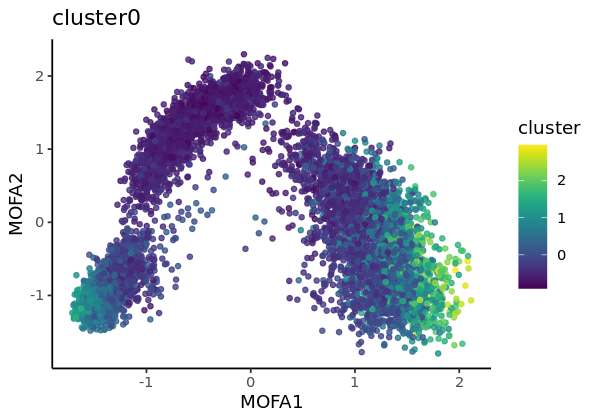

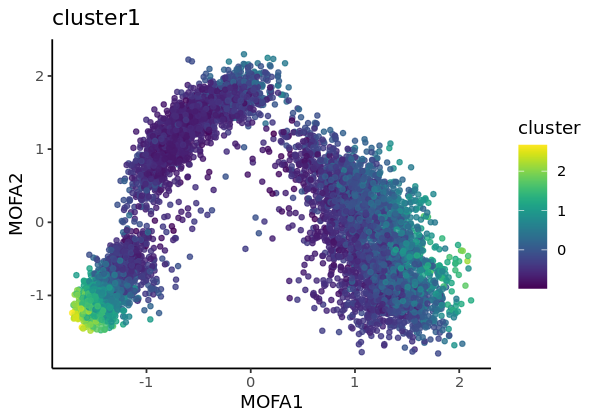

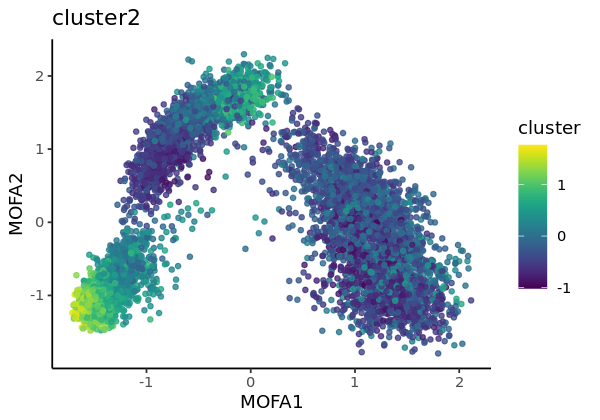

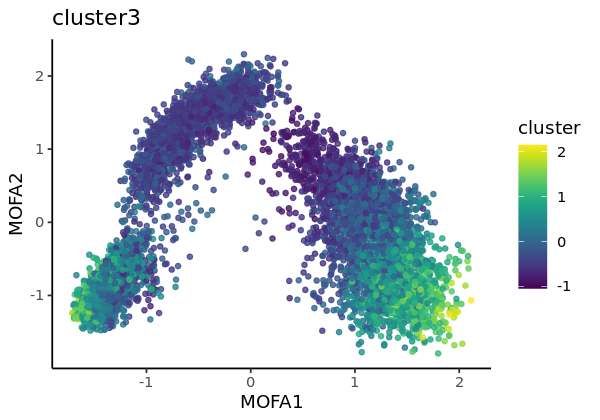

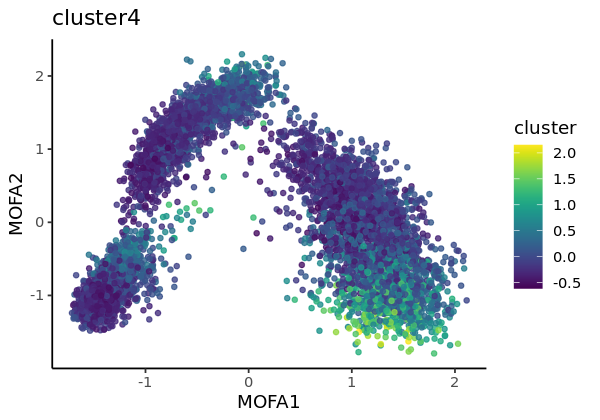

...

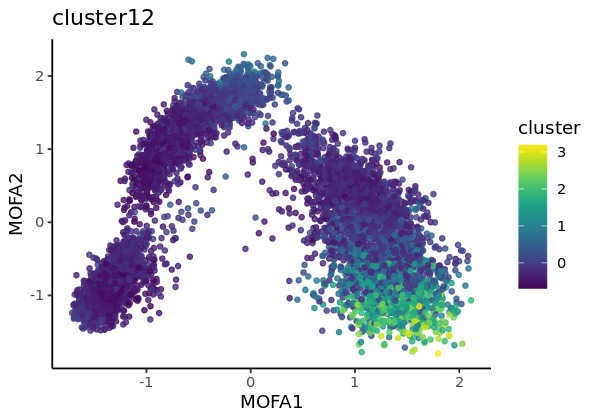

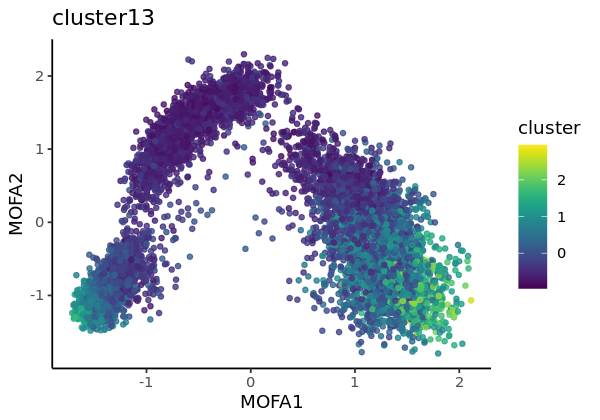

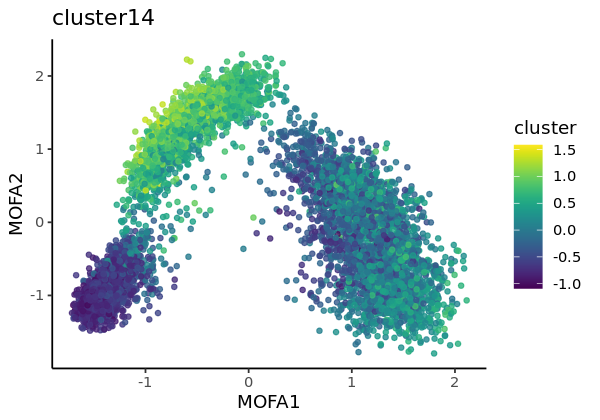

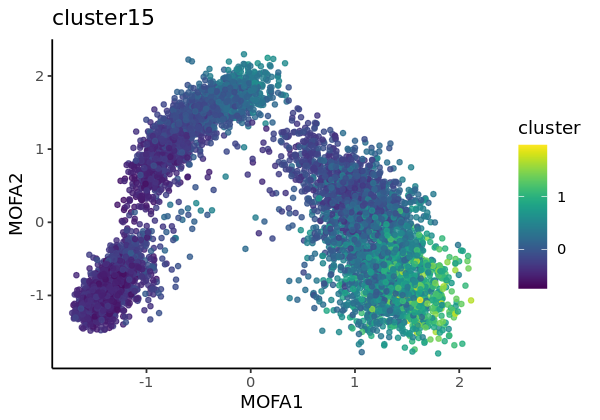

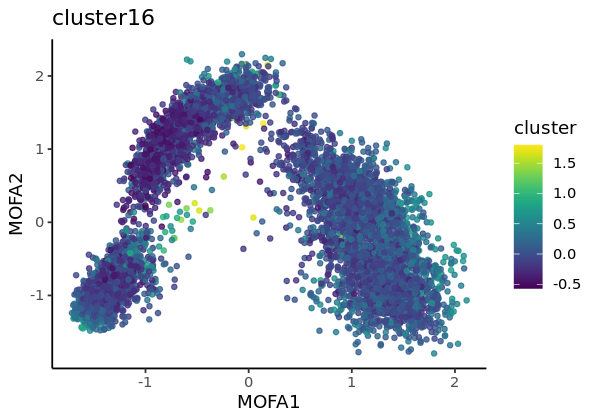

In [11]:
options(repr.plot.width = 5, repr.plot.height = 3.5)
for (i in 1:ncol(cluster_summaries)){
    df_to_plot = cbind(df_pcs, data.frame(cluster = as.numeric(cluster_summaries[,i])))
    p = ggplot(df_to_plot, aes(x = MOFA1, y = MOFA2, col = cluster)) + geom_point(alpha = 0.8, size = 1.2) 
    p = p + ggtitle(colnames(cluster_summaries)[i])
    p = p + theme_classic() + scale_color_viridis()
    print(p)
}

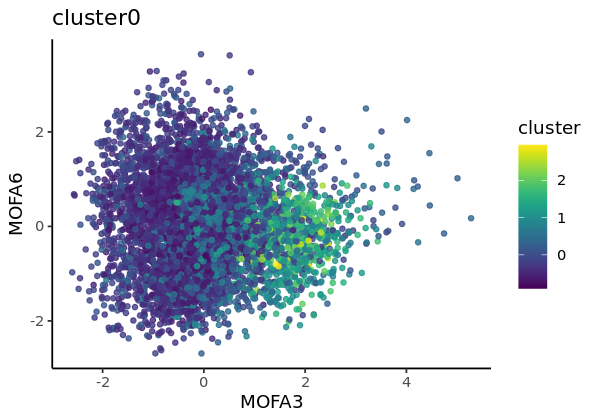

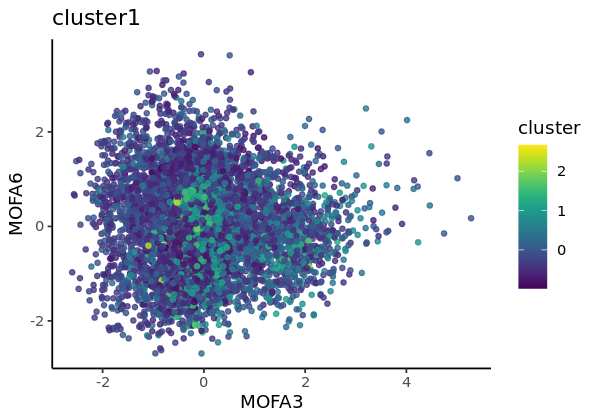

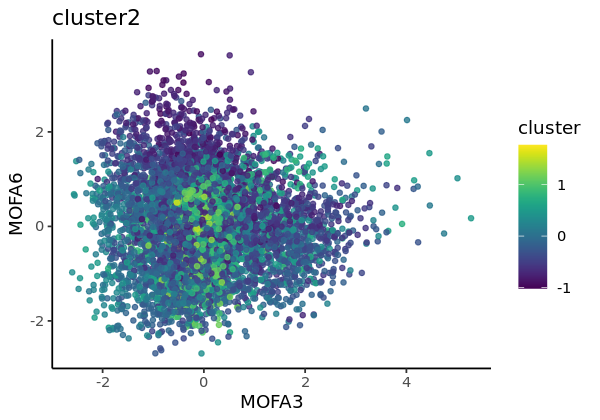

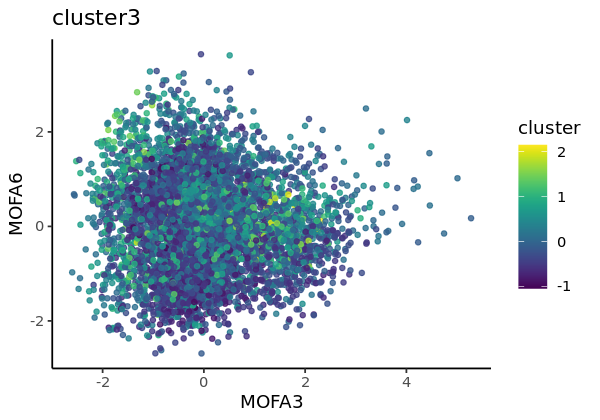

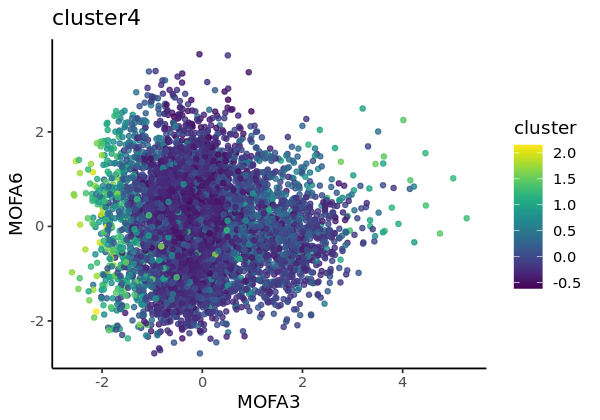

...

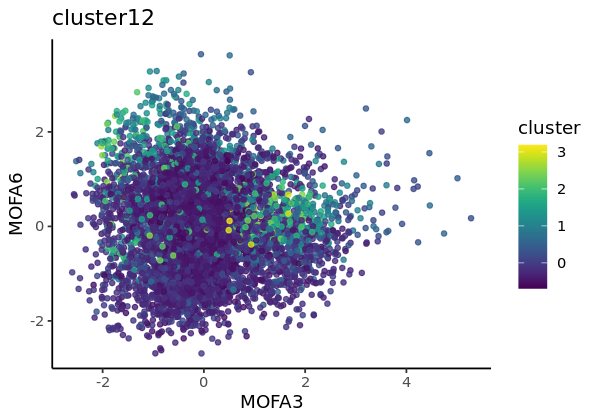

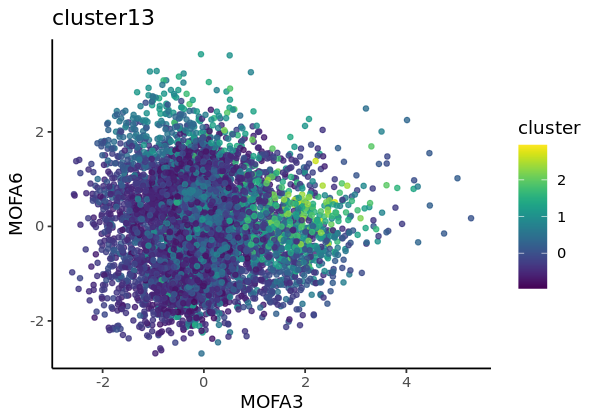

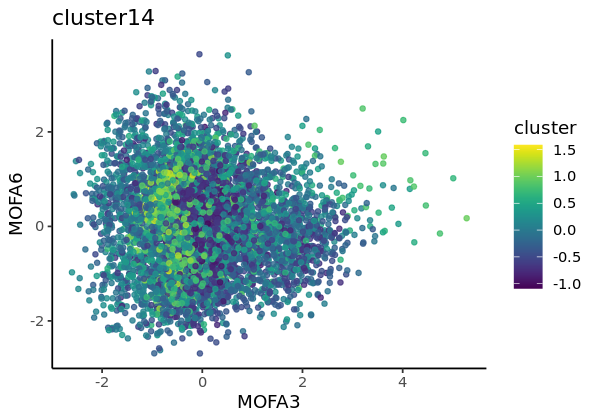

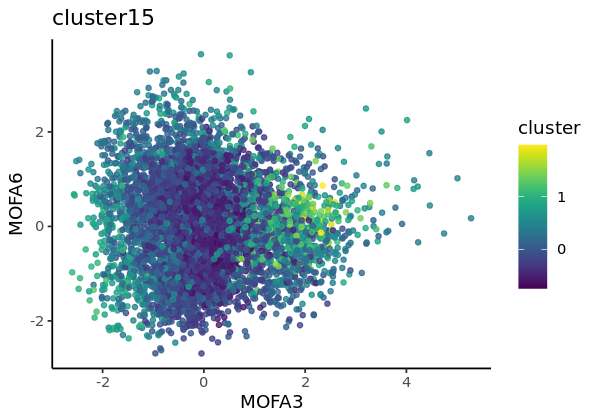

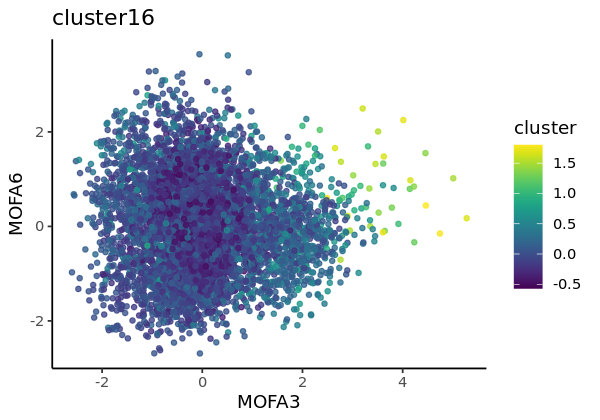

In [12]:
for (i in 1:ncol(cluster_summaries)){
    df_to_plot = cbind(df_pcs, data.frame(cluster = as.numeric(cluster_summaries[,i])))
    p = ggplot(df_to_plot, aes(x = MOFA3, y = MOFA6, col = cluster)) + geom_point(alpha = 0.8, size = 1.2) 
    p = p + ggtitle(colnames(cluster_summaries)[i])
    p = p + theme_classic() + scale_color_viridis()
    print(p)
}

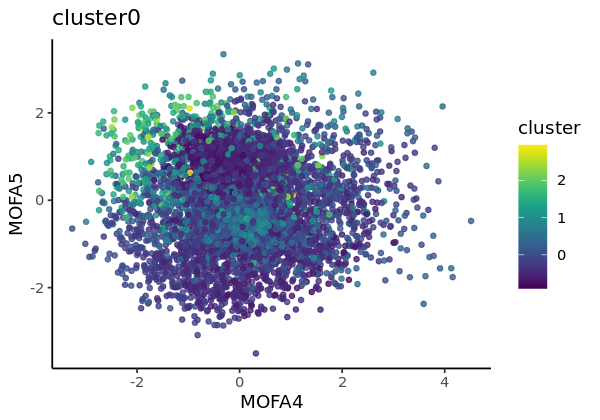

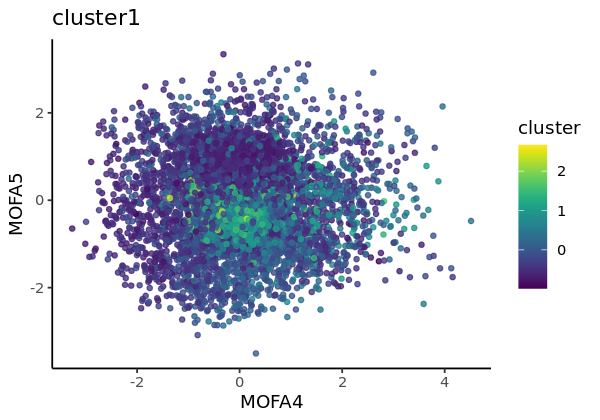

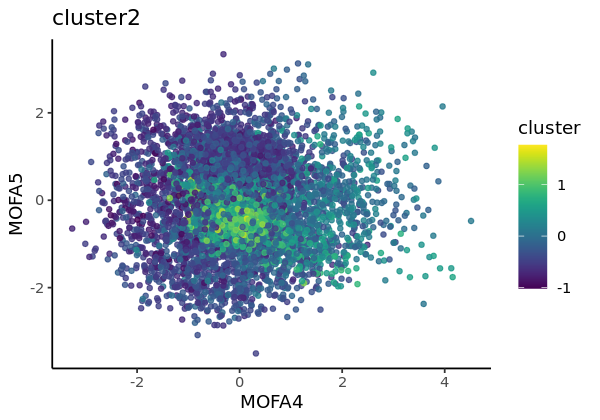

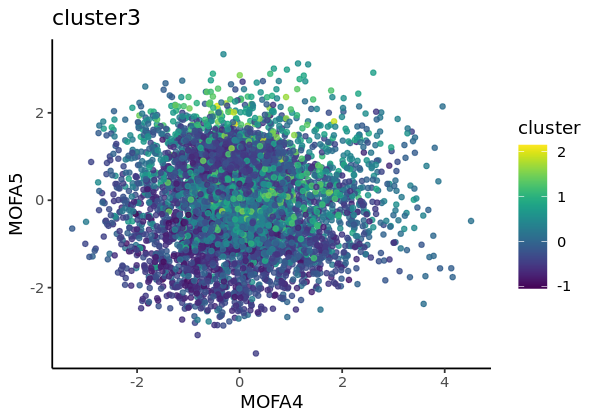

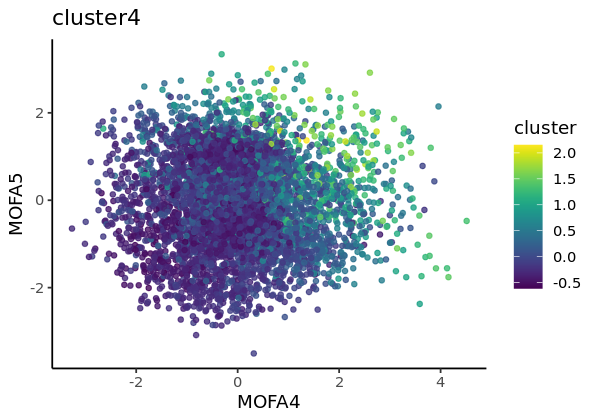

...

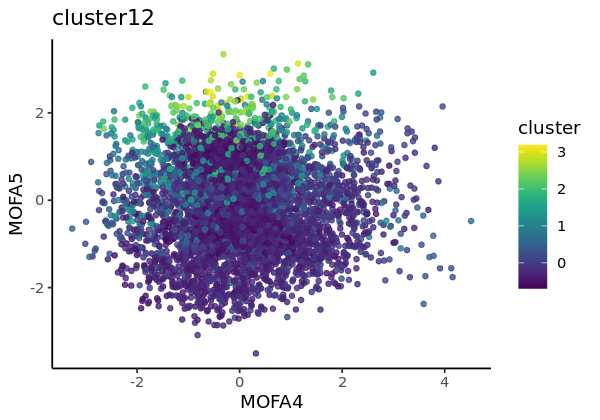

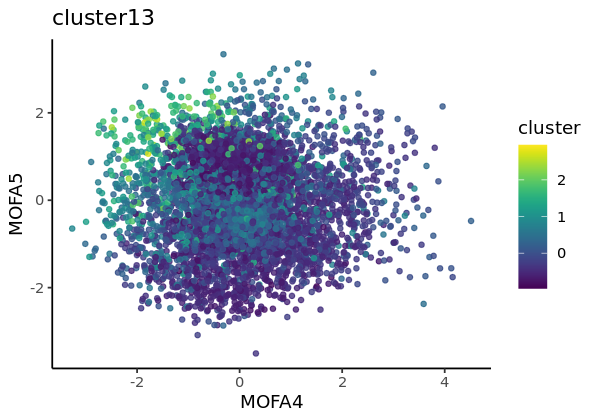

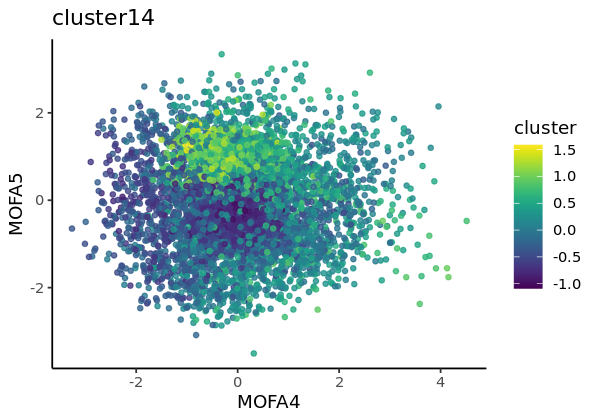

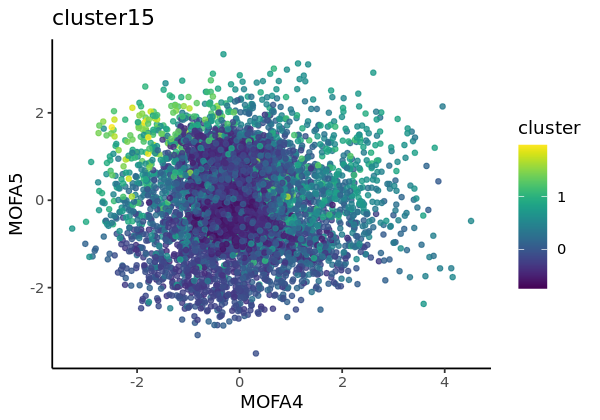

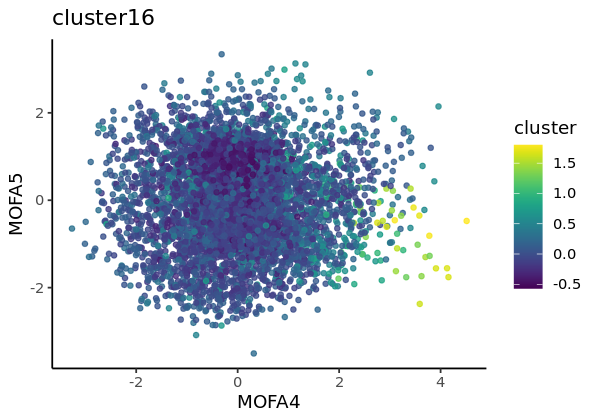

In [13]:
for (i in 1:ncol(cluster_summaries)){
    df_to_plot = cbind(df_pcs, data.frame(cluster = as.numeric(cluster_summaries[,i])))
    p = ggplot(df_to_plot, aes(x = MOFA4, y = MOFA5, col = cluster)) + geom_point(alpha = 0.8, size = 1.2) 
    p = p + ggtitle(colnames(cluster_summaries)[i])
    p = p + theme_classic() + scale_color_viridis()
    print(p)
}

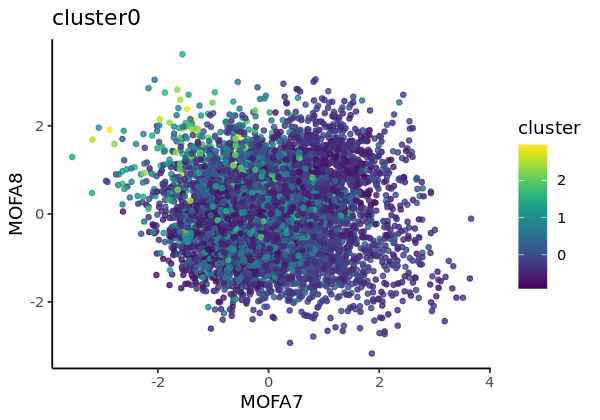

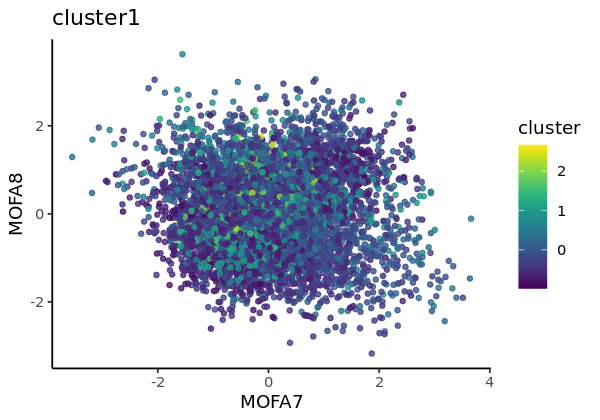

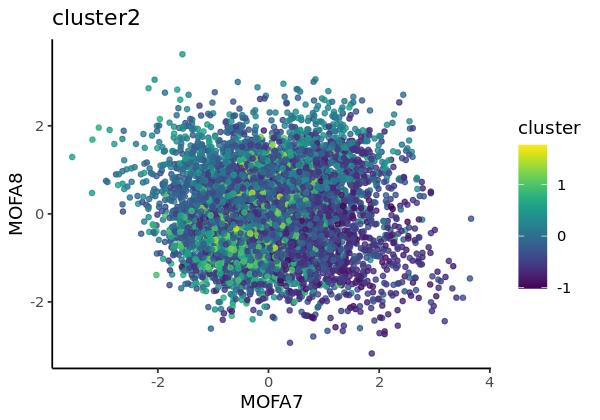

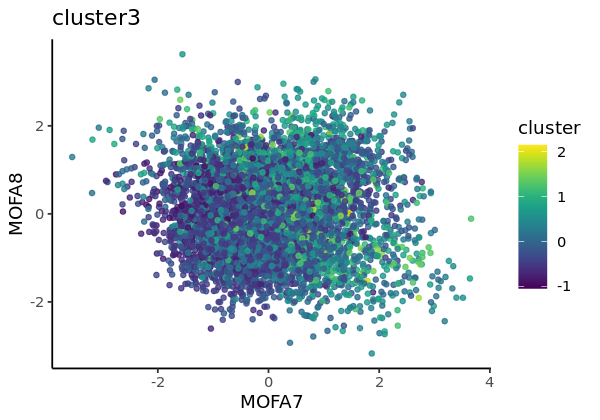

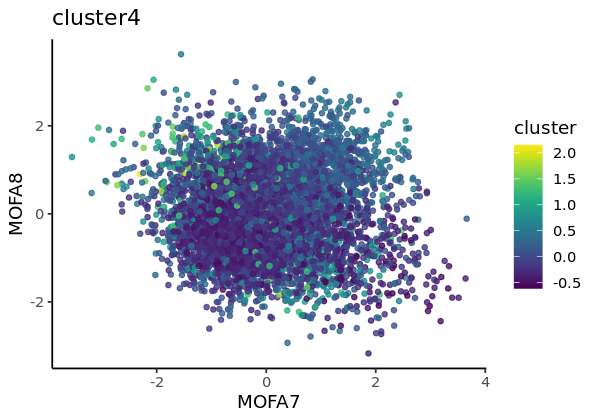

...

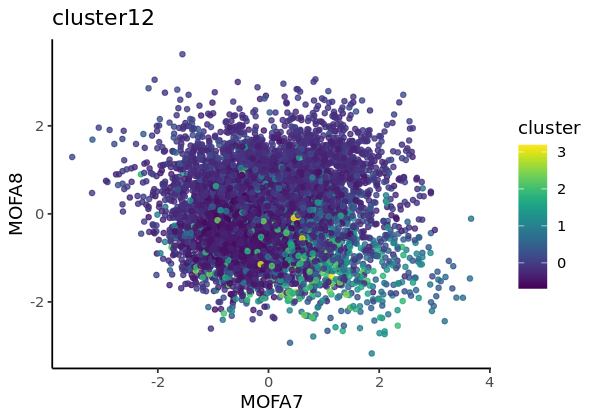

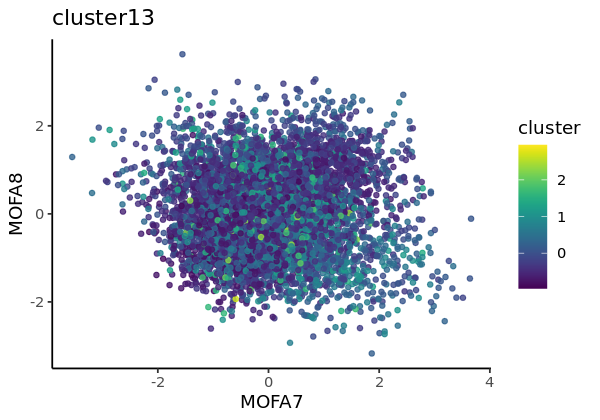

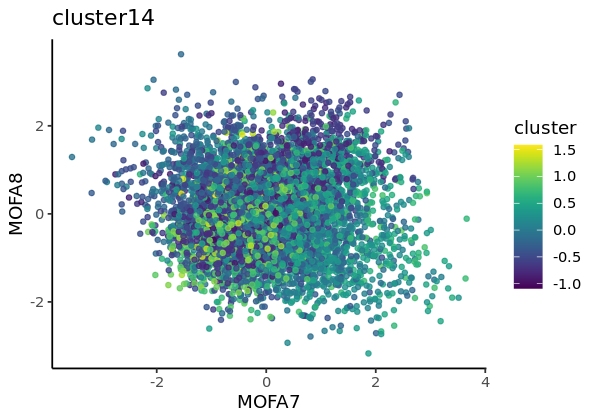

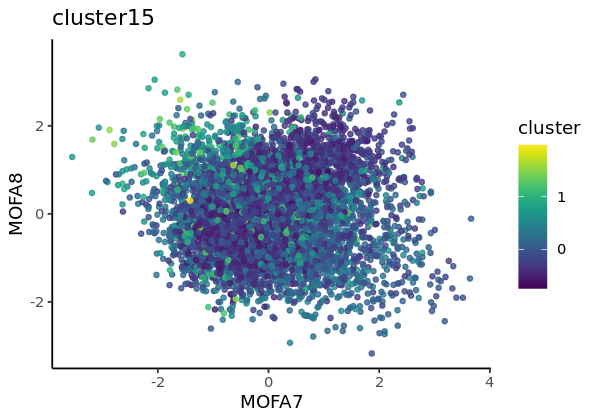

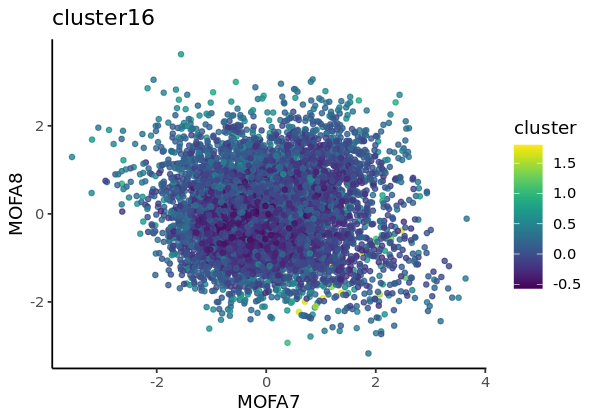

In [14]:
for (i in 1:ncol(cluster_summaries)){
    df_to_plot = cbind(df_pcs, data.frame(cluster = as.numeric(cluster_summaries[,i])))
    p = ggplot(df_to_plot, aes(x = MOFA7, y = MOFA8, col = cluster)) + geom_point(alpha = 0.8, size = 1.2) 
    p = p + ggtitle(colnames(cluster_summaries)[i])
    p = p + theme_classic() + scale_color_viridis()
    print(p)
}

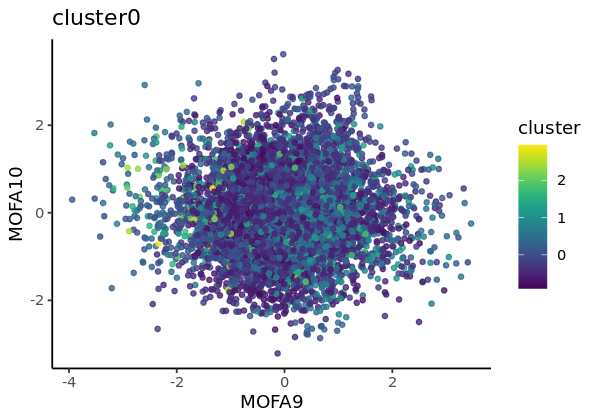

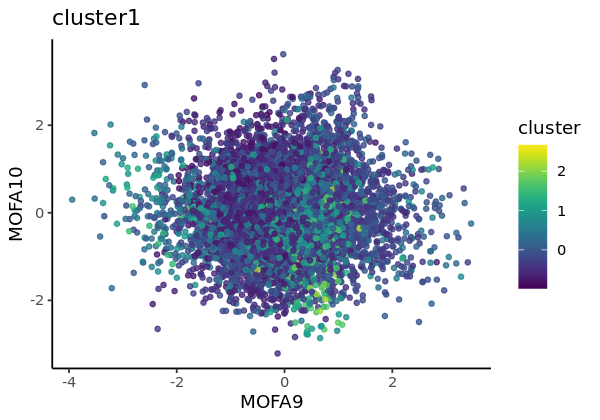

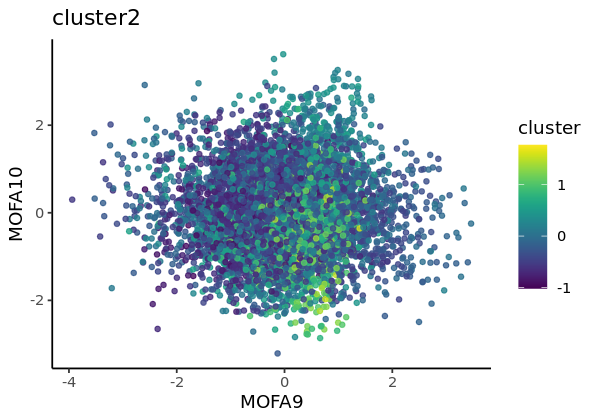

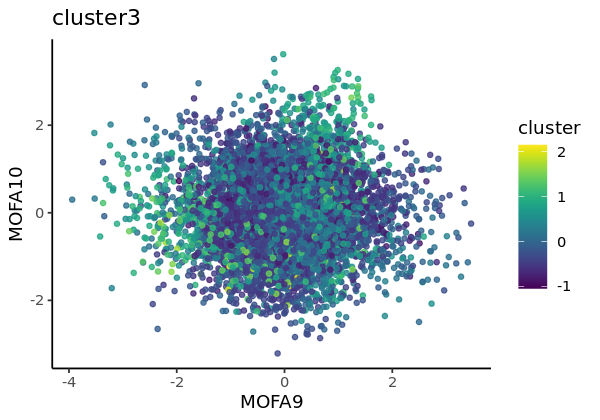

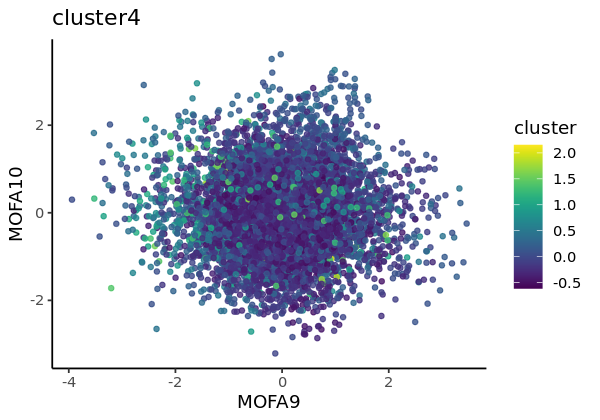

...

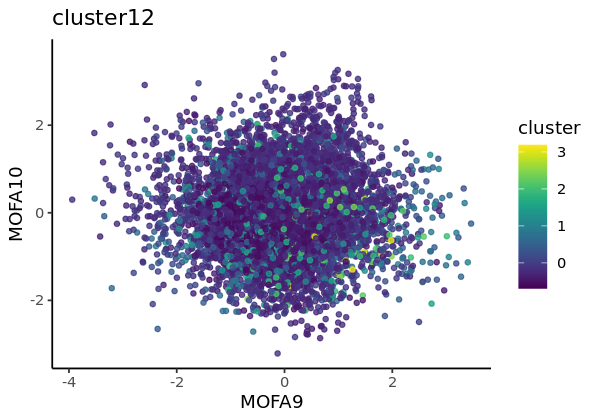

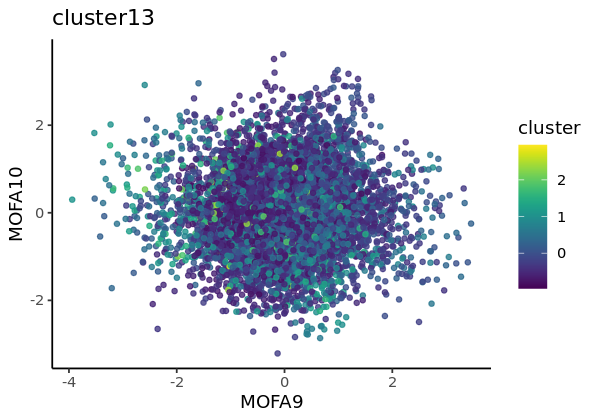

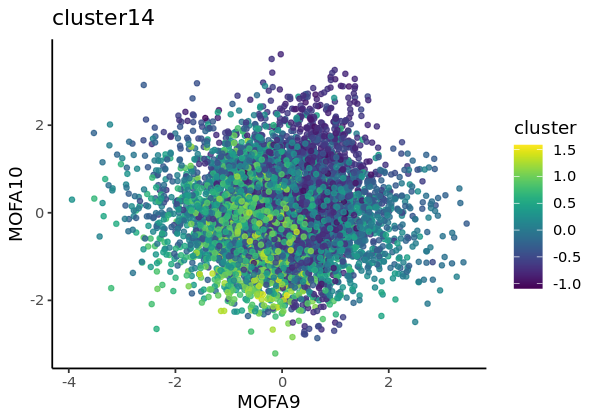

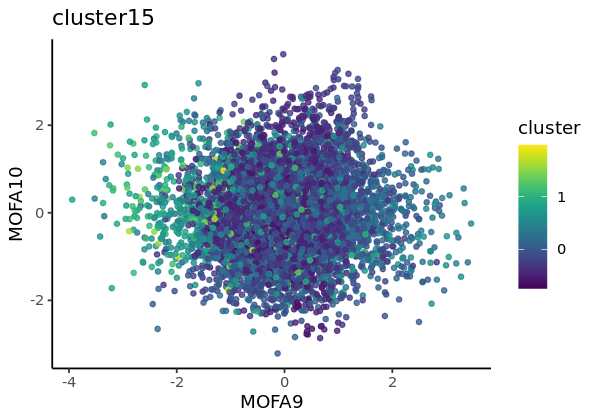

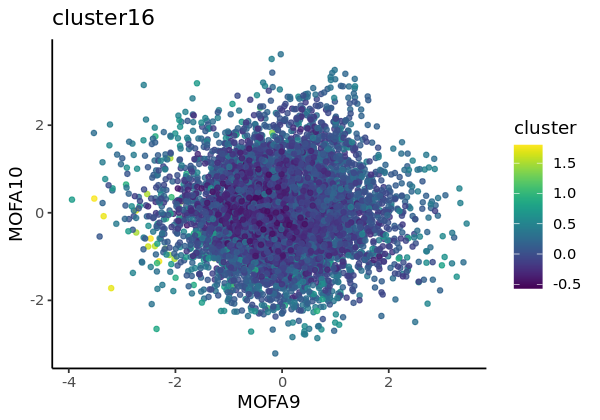

In [15]:
for (i in 1:ncol(cluster_summaries)){
    df_to_plot = cbind(df_pcs, data.frame(cluster = as.numeric(cluster_summaries[,i])))
    p = ggplot(df_to_plot, aes(x = MOFA9, y = MOFA10, col = cluster)) + geom_point(alpha = 0.8, size = 1.2) 
    p = p + ggtitle(colnames(cluster_summaries)[i])
    p = p + theme_classic() + scale_color_viridis()
    print(p)
}